# Supplementary Figures S11–S18: MOSTA

Calculate growth rates, cell-type proportions, gene programs, GO enrichment,
and ligand–receptor time courses, then draw the MOSTA supplementary figures.
The calculations start from simulated cell states and the trained model.

To simulate these states yourself, first run the
[MOSTA trajectory tutorial](../dataset_workflows/mosta.ipynb).
Here we start from the saved simulated populations used in the paper and
recalculate the downstream results. Training and trajectory simulation are
not repeated in this notebook.

## Data and software

Run this notebook from the [CytoBridge code folder](../../installation.md).
The three downloads supply different inputs:

| Archive | Input used below |
| --- | --- |
| `mosta_figure_data.zip` | Simulated cell states, tissue labels, and fixed-particle lineage labels |
| `mosta_model.zip` | Trained drift, growth, and interaction networks |
| `mosta_analysis_data.zip` | `aligned.h5ad`, including PCA loadings, gene names, and the PCA centre |

The aligned file is approximately 15.5 GB after extraction. We open it in
backed mode because these calculations need its PCA metadata, not its full
expression matrix. Use a GPU for the attention calculation in S18.

S16 and S17 also use R with `clusterProfiler`, `AnnotationDbi`, and
`org.Mm.eg.db`. The paper used R 4.3, clusterProfiler 4.10.0, and
org.Mm.eg.db 3.18.0. With R 4.3, install these once in an R session:

```r
install.packages("BiocManager")
BiocManager::install(version = "3.18")
BiocManager::install(c("clusterProfiler", "AnnotationDbi", "org.Mm.eg.db"))
```

The following cell downloads only archives whose required input is absent.
If you already downloaded the data, set `CYTOBRIDGE_PROJECT_DIR` to that directory.

In [1]:
import os
import json
import subprocess
from pathlib import Path

import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import CytoBridge as cb
from IPython.display import Image, display
from reproduction.mosta.figures import SOURCE, PALETTE_FILE, style, save

project = Path(os.environ.get("CYTOBRIDGE_PROJECT_DIR", ".")).resolve()
data = project / "data/mosta"
for archive, required in [
    ("mosta_figure_data.zip", data / "paper/shared/s4/observed_t0.h5ad"),
    ("mosta_model.zip", data / "model/Finetune/best_model.pth"),
    ("mosta_analysis_data.zip", data / "aligned.h5ad"),
]:
    if not required.is_file():
        cb.datasets.download("mosta", destination=project, kind=archive)

output = project / "outputs/mosta_paper_calculated"
output.mkdir(parents=True, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
rscript = os.environ.get("RSCRIPT", "Rscript")

def show(paths):
    for path in paths:
        if Path(path).suffix == ".png":
            display(Image(filename=str(path), width=850))

style()

## Load the simulated populations

Each H5AD stores the complete model state in `X`: two spatial coordinates
followed by 50 PCA features. `obs["Annotation"]` contains the tissue label
assigned by the classifier during the trajectory calculation.

There are 13 states from t=0 to t=3 at intervals of 0.25. The population starts
from 50,000 sampled cells at t=0 and changes through the model's growth process.

To continue from your own run of the trajectory tutorial, set `state_dir` to
`project / "outputs/mosta_trajectory/generated_states"` and `lineage_file` to
`project / "outputs/mosta_trajectory/fixed_particle_labels.csv.gz"`.
The later cells use these variables throughout.

In [2]:
times = tuple(float(t) for t in np.arange(0, 3.0001, 0.25))
state_dir = data / "paper/shared/generated_states"
lineage_file = data / "paper/shared/s7_lineage/fixed_particle_labels.csv.gz"

generated = {}
for time in times:
    filename = state_dir / f"time_{time:g}.h5ad"
    if not filename.is_file():
        filename = state_dir / f"time_{str(f'{time:g}').replace('.', 'p')}.h5ad"
    generated[str(time)] = ad.read_h5ad(filename)

loaded = cb.tl.load_dynamical_model_from_dir(data / "model", dim=52, device=device)
reference = ad.read_h5ad(data / "aligned.h5ad", backed="r")
palette = json.loads(PALETTE_FILE.read_text())
pd.Series({t: generated[str(t)].n_obs for t in times}, name="Generated cells")

0.00     50000
0.25     56678
0.50     63294
0.75     69774
1.00     76023
1.25     81521
1.50     86643
1.75     91112
2.00     94897
2.25     98198
2.50    100920
2.75    103271
3.00    105165
Name: Generated cells, dtype: int64

## S11. Spatial populations

This figure is a view of the trajectory output. Plot the measured starting
population, followed by generated populations at half-step intervals.
Coordinates and tissue labels come directly from the H5AD arrays.

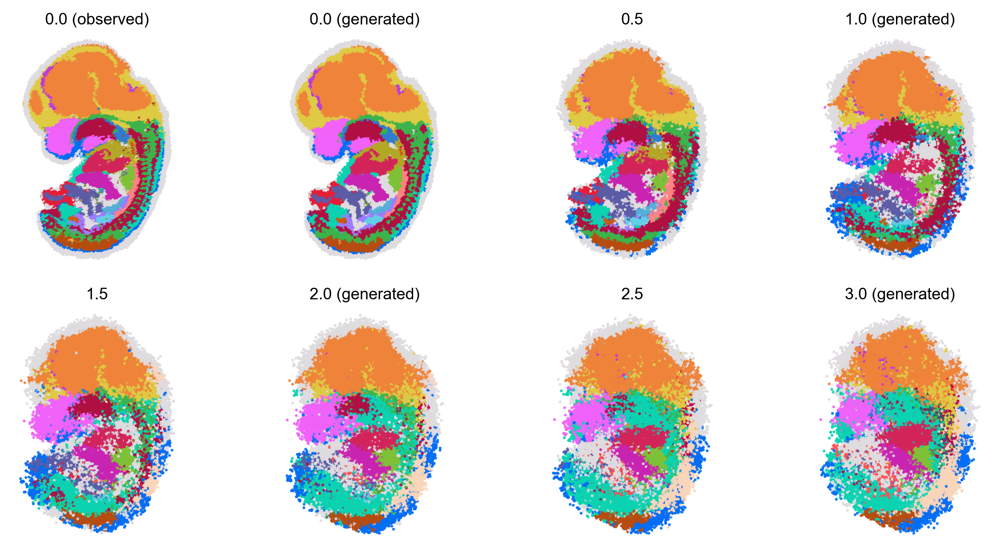

In [3]:
observed = ad.read_h5ad(data / "paper/shared/s4/observed_t0.h5ad")
panels = [("0.0 (observed)", observed)]
panels += [(f"{t:.1f}" + (" (generated)" if t in (0, 1, 2, 3) else ""),
            generated[str(float(t))]) for t in np.arange(0, 3.001, 0.5)]
fig, axes = plt.subplots(2, 4, figsize=(8.8, 4.4))
for axis, (title, population) in zip(axes.flat, panels):
    xy = population.obsm["spatial"]
    labels = population.obs["Annotation"].astype(str)
    axis.scatter(xy[:, 0], xy[:, 1], c=[palette[label] for label in labels],
                 s=2.5, alpha=0.9, linewidths=0)
    axis.set_aspect("equal")
    axis.set_axis_off()
    axis.set_title(title, fontsize=9, pad=3)
fig.tight_layout()
show(save(fig, output, "Figure_S11_MOSTA_spatial_states"))

## S12. Brain growth

Evaluate the trained growth network at each cell's state and time.
`evaluate_growth_by_timepoint` calls `model.predict_growth(t, x)` and returns
one growth rate per cell, together with its coordinates and tissue label.
The values are model predictions, not differences between consecutive cell counts.

In [4]:
growth = cb.tl.evaluate_growth_by_timepoint(
    generated, loaded.model, time_points=times,
    annotation_key="Annotation", spatial_key="spatial", device=device,
)
growth.to_csv(output / "growth_by_cell.csv", index=False)
brain = growth.loc[growth["celltype"].eq("Brain")].copy()
brain.groupby("time")["growth"].agg(["count", "mean", "median"])

,count,mean,median
time,,,
0.00,11397,0.503412,0.471669
0.25,13108,0.461276,0.434822
0.50,15055,0.413279,0.395672
0.75,17019,0.363380,0.355262
1.00,18429,0.314060,0.311309
1.25,19975,0.266651,0.267741
1.50,21568,0.220841,0.224405
1.75,23255,0.178849,0.183116
2.00,24684,0.141754,0.145512


Pass these newly calculated rates to the plotting function. All panels use
the pooled 5th and 95th percentiles as colour limits. As in the paper, t=1.5
contributes to the common scale but is omitted from the 12-panel display.

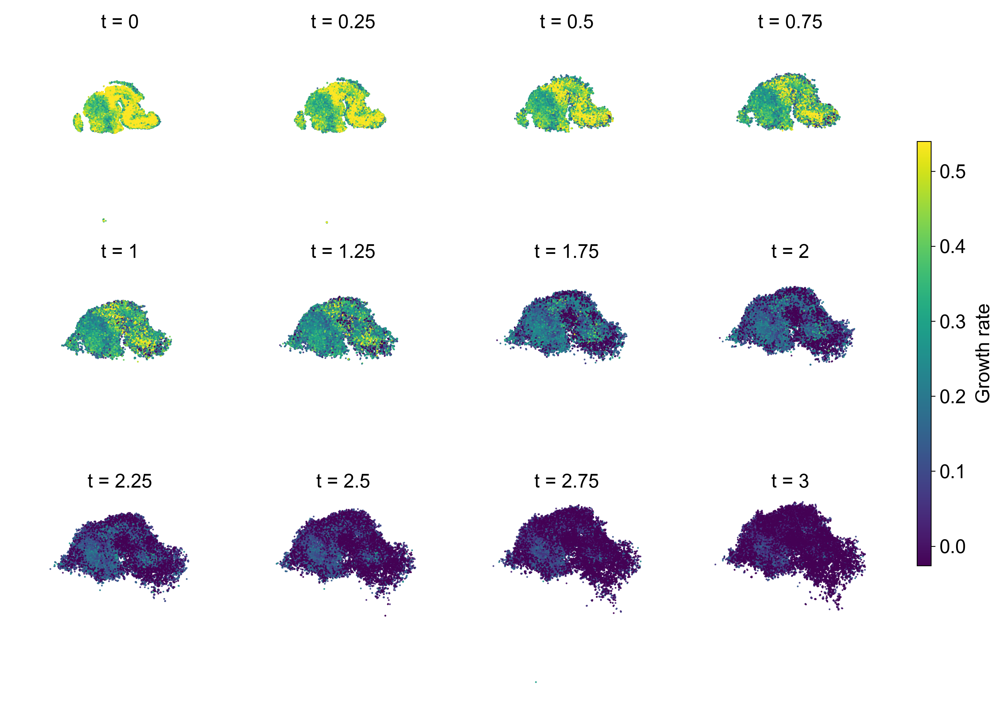

In [5]:
from reproduction.mosta.growth import plot_brain_growth

vmin, vmax = np.quantile(brain["growth"], [0.05, 0.95])
fig, growth_summary = plot_brain_growth(brain, vmin=vmin, vmax=vmax)
growth_summary.to_csv(output / "S12_growth_summary.csv", index=False)
fig.savefig(output / "Figure_S12_MOSTA_growth.pdf")
fig.savefig(output / "Figure_S12_MOSTA_growth.png", dpi=300)
plt.close(fig)
show([output / "Figure_S12_MOSTA_growth.png"])

## S13. Cell-type composition

Count tissue labels at each time and divide by the total population at that
time to obtain proportions. The figure shows 15 tissue classes and combines
the remaining classes as Other.

,time_index,time,celltype,count,fraction,total
0,0,0.0,Blood vessel,1424,0.02848,50000
1,0,0.0,Brain,11397,0.22794,50000
2,0,0.0,Cartilage primordium,3830,0.07660,50000
3,0,0.0,Cavity,6527,0.13054,50000
4,0,0.0,Choroid plexus,432,0.00864,50000


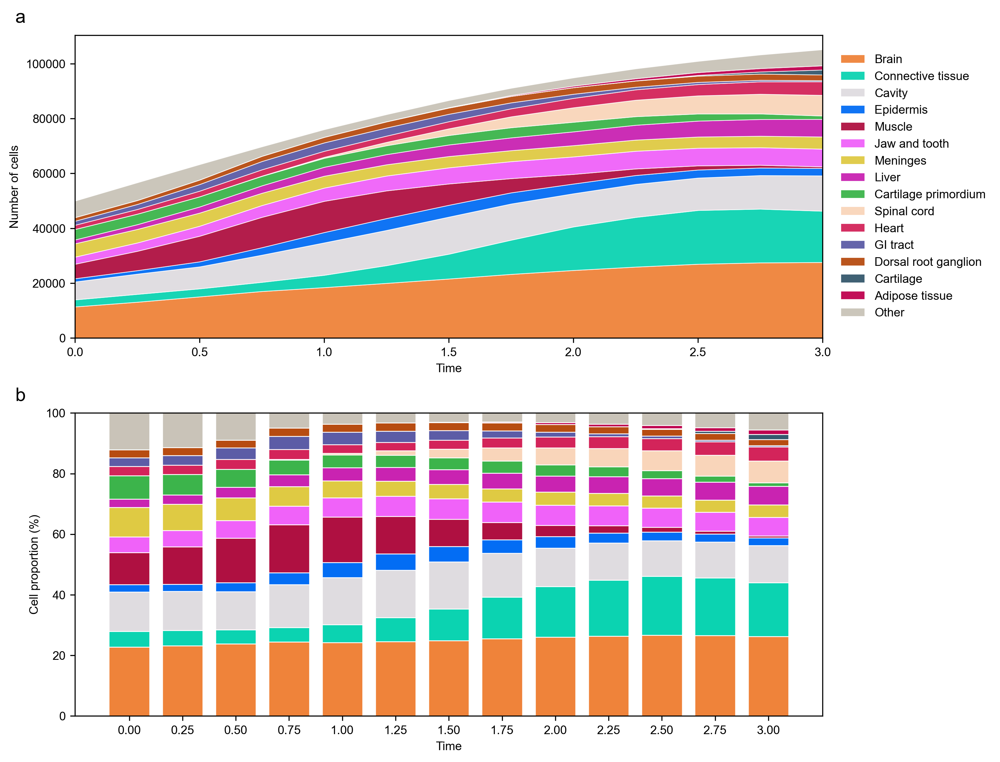

In [6]:
from reproduction.mosta.figures import plot_composition

labels_by_time = [generated[str(t)].obs["Annotation"].astype(str).to_numpy() for t in times]
composition = cb.tl.summarize_label_composition(labels_by_time, times)
composition.to_csv(output / "celltype_composition.csv", index=False)
display(composition.head())
show(plot_composition(composition, output))

## S14. Lineage transitions

The fixed-population trajectory keeps the same particle IDs through time.
Its labels are saved separately from the growing populations above. For each
pair of consecutive times, count how many particles move from one tissue
label to another. The table below contains these counts.

In [7]:
particle_labels = pd.read_csv(lineage_file)
lineage_times = np.arange(0, 3.001, 0.5)
labels = particle_labels.pivot(index="particle_id", columns="time", values="celltype")
labels = labels.reindex(columns=lineage_times).sort_index()
if labels.isna().any().any():
    raise ValueError("Each particle needs a label at every lineage time.")

transitions = []
for before, after in zip(lineage_times[:-1], lineage_times[1:]):
    pairs = pd.DataFrame({"source": labels[before], "target": labels[after]})
    counts = pairs.value_counts().rename("count").reset_index()
    counts["start_time"], counts["end_time"] = before, after
    transitions.append(counts)
transitions = pd.concat(transitions, ignore_index=True)
transitions.to_csv(output / "S14_lineage_transitions.csv", index=False)
transitions.head()

,source,target,count,start_time,end_time
0,Brain,Brain,10521,0.0,0.5
1,Cavity,Cavity,4659,0.0,0.5
2,Muscle,Muscle,4315,0.0,0.5
3,Meninges,Meninges,3326,0.0,0.5
4,Cartilage primordium,Cartilage primordium,2293,0.0,0.5


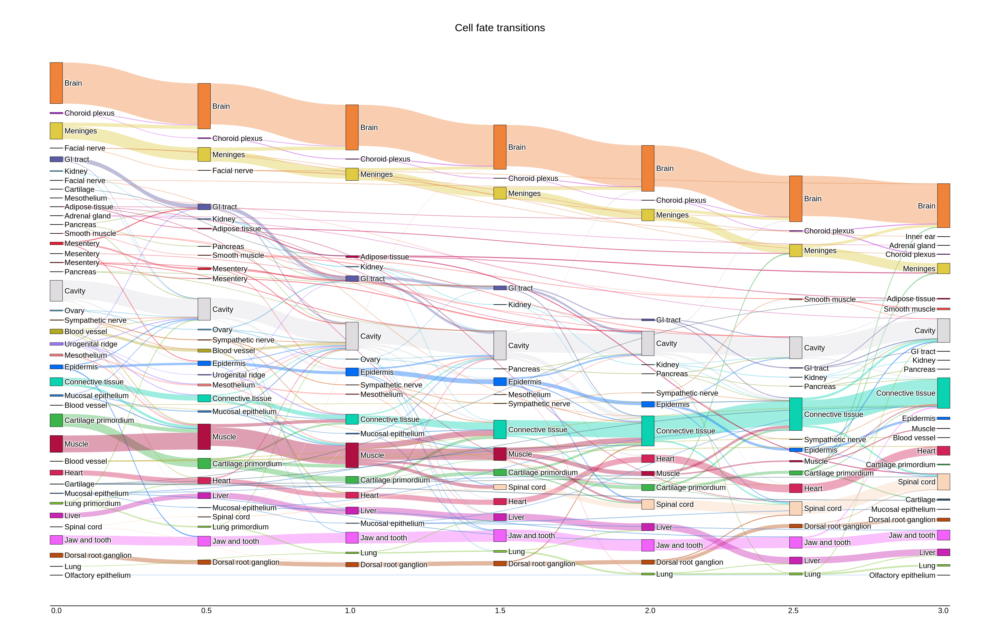

In [8]:
fig = cb.pl.plot_sankey(
    predicted_labels_list=[labels[t].tolist() for t in lineage_times],
    out_html=str(output / "Figure_S14_MOSTA_lineage.html"),
    start_index=0, time_keys=[f"{t:.1f}" for t in lineage_times],
    show_time_axis=True, min_flow=None, keep_source_cumfrac=0.8,
    normalize_mode=None, label_to_color=palette,
    lineage_anchor_mode=False, style="nature-methods",
    title="Cell fate transitions", width=None, height=None,
)
fig.update_layout(font={"family": "Arial", "color": "black"})
fig.write_image(str(output / "Figure_S14_MOSTA_lineage.pdf"))
fig.write_image(str(output / "Figure_S14_MOSTA_lineage.png"), scale=2)
show([output / "Figure_S14_MOSTA_lineage.png"])

## S15. Brain gene programs

Reconstruct log1p expression from each Brain cell's PCA features using the
loadings and centre stored in `aligned.h5ad`. Negative reconstructed values
are set to zero **before** averaging over cells at each time.

Use the original 2,000 highly variable genes, excluding LR genes added during
preprocessing. Rank genes by the variance of their temporal means. Then
standardize each gene's profile across time and apply Ward clustering with
two groups. `gene.expression` and `gene.clustering` below are calculated from
the cell states, rather than loaded from the archived gene tables.

In [9]:
brain_states = {
    key: population[population.obs["Annotation"].astype(str).eq("Brain")].copy()
    for key, population in generated.items()
}
added_genes = set(map(str, reference.uns["preprocess_info"].get("required_latent_features_added", [])))
highly_variable = reference.var_names[reference.var["highly_variable"].astype(bool)]
candidate_genes = [str(gene) for gene in highly_variable if str(gene) not in added_genes]

gene = cb.tl.summarize_temporal_gene_patterns(
    brain_states, reference, time_points=times, spatial_dim=2,
    reference_layer=None, candidate_features=candidate_genes,
    n_top_genes=len(candidate_genes), n_cluster_genes=len(candidate_genes),
    n_clusters=2, preferred_species_tag=None, active_features_only=True,
    profile_normalization="zscore", profile_linkage_method="ward",
    profile_cluster_order="peak_time", clip_min=0.0,
    reconstruction_batch_size=4096,
)
gene.expression.to_csv(output / "brain_gene_means.csv")
program_file = output / "brain_gene_programs.csv"
gene.clustering.assignments.to_csv(program_file, index=False)
display(gene.expression.iloc[:5])
display(gene.clustering.assignments.groupby("cluster").size().rename("Genes"))

,0.00,0.25,0.50,0.75,1.00,1.25,1.50,1.75,2.00,2.25,2.50,2.75,3.00
Actc1,0.346652,0.385415,0.425749,0.465218,0.500232,0.531385,0.557388,0.573505,0.580332,0.574270,0.555776,0.524266,0.483402
Arxes2,0.296285,0.297139,0.294801,0.290408,0.284858,0.279229,0.273464,0.266316,0.259217,0.251980,0.243847,0.235372,0.226713
Bnc2,0.109799,0.110334,0.112137,0.111637,0.110165,0.108909,0.107478,0.108758,0.110792,0.115192,0.121490,0.130256,0.139205
Calm2,1.966156,1.950667,1.922237,1.889422,1.843155,1.804273,1.759863,1.706140,1.647351,1.582189,1.508859,1.426649,1.341668
Cdca8,0.724982,0.648358,0.580917,0.526850,0.487528,0.452011,0.417991,0.389447,0.364312,0.344237,0.328237,0.314055,0.302993


cluster
1     883
2    1117
Name: Genes, dtype: int64

Panel a displays the 25 genes with the greatest temporal variance. Panel b
shows the two program means and their gene profiles. The labelled genes are
selected by the sum of their variance rank and correlation rank within each
program, using `select_representative_genes`.

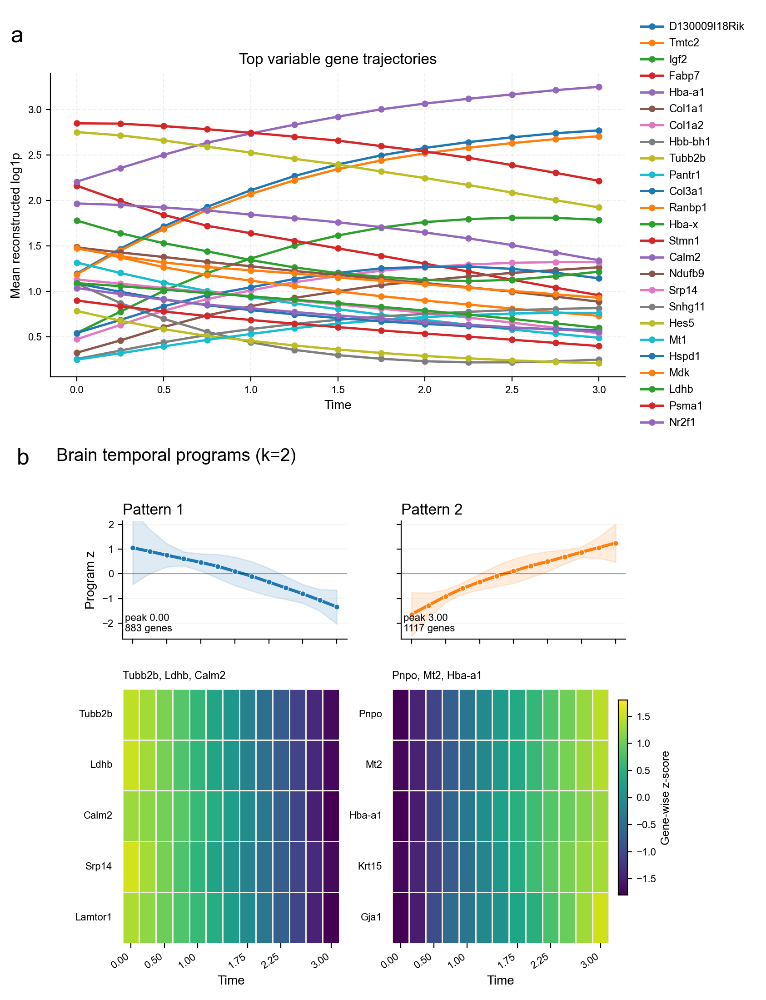

In [10]:
from reproduction.mosta import gene_programs
from reproduction.mosta.program_genes import select_representative_genes

representatives = select_representative_genes(
    gene.expression, gene.clustering.normalized_profiles,
    gene.clustering.assignments, n_per_program=5,
)
representatives.to_csv(output / "brain_representative_genes.csv", index=False)
paths = gene_programs.render({
    "mean": gene.expression,
    "zscore": gene.clustering.normalized_profiles,
    "top20": gene.top_variable_genes.head(20),
    "variance_rank": gene.top_variable_genes,
    "assignments": gene.clustering.assignments,
    "prototypes": gene.clustering.prototypes,
    "representatives": representatives,
}, output)
show([paths["png"]])

## S16. Gene-program enrichment

Use the two gene groups calculated in S15 as queries and all 2,000 candidate
genes as the background. The R script maps mouse symbols to Entrez IDs and
tests GO terms with `clusterProfiler::enrichGO`:

```r
result <- enrichGO(
    gene = query, universe = universe, OrgDb = org.Mm.eg.db,
    keyType = "ENTREZID", ont = "ALL", pool = TRUE,
    pAdjustMethod = "BH", pvalueCutoff = 1, qvalueCutoff = 1,
    minGSSize = 5, maxGSSize = 500, readable = TRUE
)
```

BP, MF, and CC terms are tested together. Within each gene group, adjust
p-values by the Benjamini–Hochberg procedure and display up to 20 terms with
adjusted p < 0.05. The Python cell runs this R calculation, then plots its
new output tables. The complete R code is `reproduction/mosta/enrich_go.R`.

s9_pattern_1: 3554 tested terms, 305 with adjusted p < 0.05


s9_pattern_2: 3520 tested terms, 11 with adjusted p < 0.05


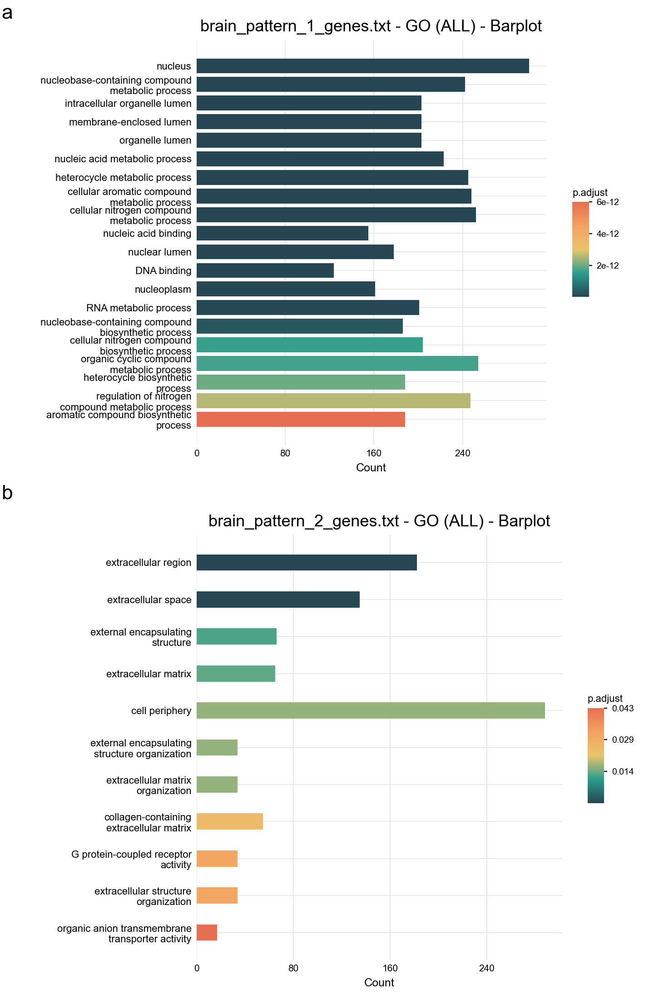

In [11]:
from reproduction.mosta import gene_enrichment

go_script = Path(gene_enrichment.__file__).with_name("enrich_go.R")
go_output = output / "go_enrichment"
subprocess.run([
    rscript, str(go_script), str(program_file), str(program_file),
    "cluster", "s9_pattern_", str(go_output),
], check=True)
paths, details = gene_enrichment.render_s9(go_output, output)
show([paths["png"]])

## S17. Developmental expression

Continue from `gene.expression` in S15. Select the 1,000 genes with the greatest
temporal variance, standardize their profiles, and order them by peak time.
`analyze_developmental_wave` divides this ordered matrix into three contiguous
groups by minimizing within-group squared deviations. Each group must contain
at least five genes.

In [12]:
wave = cb.tl.analyze_developmental_wave(
    gene.expression, n_top_profiles=1000, n_phases=3,
    min_phase_size=5, standardization="zscore",
)
wave_dir = output / "s10_developmental_wave"
wave_dir.mkdir(exist_ok=True)
wave.ordered_profiles.to_csv(wave_dir / "s10_top1000_peak_ordered_profiles.csv")
phase_file = wave_dir / "s10_top1000_dp3_assignments.csv"
wave.assignments.to_csv(phase_file, index=False)
wave.assignments.groupby("phase").size().rename("Genes")

phase
1    483
2    299
3    218
Name: Genes, dtype: int64

Run the same GO test for the three phase groups. The background remains
the 2,000 genes from S15. The figure combines the newly calculated expression
matrix, phase assignments, and enrichment results.

s10_phase_1: 3410 tested terms, 328 with adjusted p < 0.05


s10_phase_2: 3327 tested terms, 534 with adjusted p < 0.05


s10_phase_3: 2896 tested terms, 198 with adjusted p < 0.05


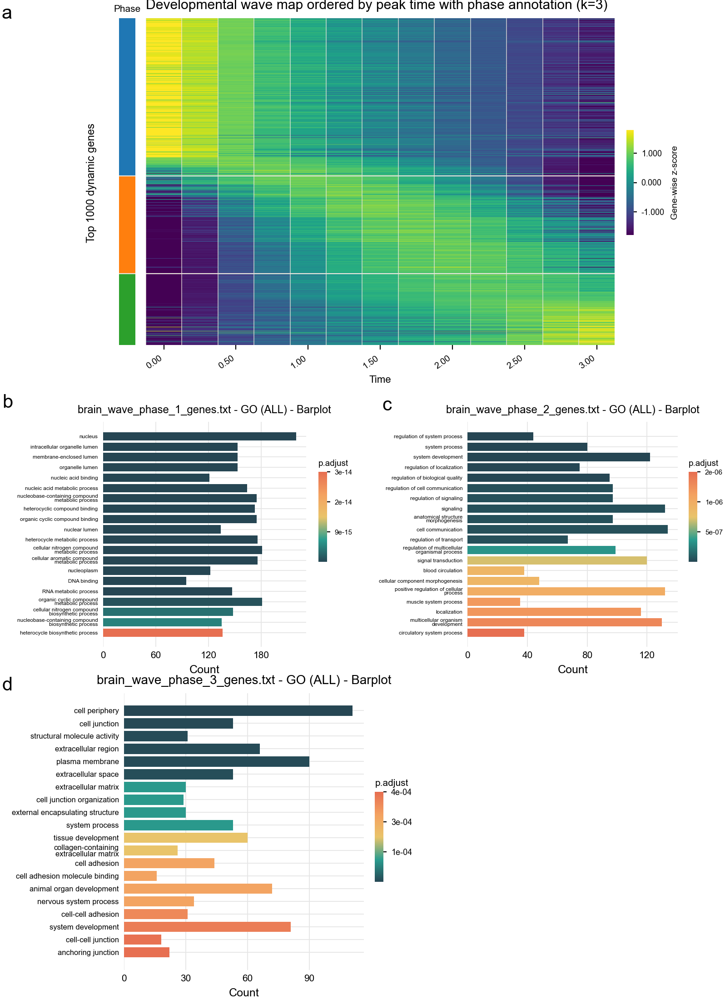

In [13]:
subprocess.run([
    rscript, str(go_script), str(program_file), str(phase_file),
    "phase", "s10_phase_", str(go_output),
], check=True)
paths, details = gene_enrichment.render_s10(output, go_output, output)
show([paths["png"]])

## S18. Ligand–receptor time courses

First evaluate the trained interaction network on 12,000 sampled cells at
each of seven half-step times, using sampling seed 42. Sum attention over directed cell edges
between each sender and receiver type. The resulting `M_sum` matrices provide
the cell-type weights for the next calculation. Self-loops are excluded and
attention values above the 99.5th percentile are capped.

In [14]:
lr_times = tuple(float(t) for t in np.arange(0, 3.001, 0.5))
runtime = cb.tl.build_dynamical_runtime(loaded)
cb.tl.set_global_random_seed(42)
communications = cb.tl.compute_timepoint_communications(
    adata_dict=generated, time_points=lr_times, annotation_key="Annotation",
    f_net=runtime.f_net, device=device, out_dir=str(output / "attention"),
    save_dense_attention_matrix=False, remove_self_loop=True,
    winsor_quantile=0.995, max_cells_per_timepoint=12000, random_seed=42,
)
pd.Series({t: len(communications[str(t)]["types"]) for t in lr_times}, name="Tissue types")

Time 0.0 cells 12000 of 50000


Time 0.5 cells 12000 of 63294
Time 1.0 cells 12000 of 76023
Time 1.5 cells 12000 of 86643
Time 2.0 cells 12000 of 94897
Time 2.5 cells 12000 of 100920
Time 3.0 cells 12000 of 105165


0.0    23
0.5    25
1.0    23
1.5    24
2.0    27
2.5    26
3.0    27
Name: Tissue types, dtype: int64

Next reconstruct gene expression in **all** generated cells, convert log1p
values to count scale cell by cell, and calculate each tissue's mean expression.
For an LR pair, multiply mean sender ligand expression, mean receiver receptor
expression, and the corresponding `M_sum` weight, then sum across tissue pairs.
Multi-subunit complexes use the minimum subunit expression and require every
subunit to be present.

`lr.pair_timecourse` contains the resulting score for every retained LR pair
at every time. Profiles are scaled to 0–1 across time and clustered into three
groups with average linkage.

In [15]:
reconstruction = cb.tl.make_pca_reconstruction_spec(
    reference.var_names.astype(str),
    np.asarray(reference.varm["PCs"], dtype=np.float32),
    np.asarray(reference.var["pca_center"], dtype=np.float32),
)
lr_database = Path(cb.__file__).parent / "workflow_databases/CellChatDB.ligrec.mouse.csv"
lr = cb.tl.project_communication_to_lr_timecourses(
    generated, reference, communications, lr_database,
    time_points=lr_times, annotation_key="Annotation", matrix_key="M_sum",
    spatial_dim=2, reference_layer=None, expression_space="count",
    complex_mode="min", require_all_subunits=True, duplicate_policy="first",
    preferred_species_tag=None, n_clusters=3,
    pca_reconstruction=reconstruction, profile_linkage_method="average",
    profile_cluster_order="peak_time", return_type_matrices=False,
)
lr.pair_timecourse.to_csv(output / "lr_pair_timecourse.csv", index=False)
lr.clustering.assignments.to_csv(output / "lr_pattern_assignments.csv", index=False)
lr.pair_timecourse.head()

,time,pair_id,ligand,receptor,pair,score,max_edge,nonzero_edges,n_cell_types,n_expression_supported_cell_types,n_expression_unsupported_cell_types,n_expression_supported_type_edges,peak_sender,peak_receiver
0,0.0,"[""Adcyap1"",""Adcyap1r1""]",Adcyap1,Adcyap1r1,Adcyap1_Adcyap1r1,74.768526,31.912076,193,23,23,0,529,Brain,Brain
1,0.5,"[""Adcyap1"",""Adcyap1r1""]",Adcyap1,Adcyap1r1,Adcyap1_Adcyap1r1,89.104602,27.707837,229,25,25,0,625,Brain,Brain
2,1.0,"[""Adcyap1"",""Adcyap1r1""]",Adcyap1,Adcyap1r1,Adcyap1_Adcyap1r1,77.361928,25.703699,205,23,23,0,529,Brain,Brain
3,1.5,"[""Adcyap1"",""Adcyap1r1""]",Adcyap1,Adcyap1r1,Adcyap1_Adcyap1r1,69.986947,25.918770,206,24,24,0,576,Brain,Brain
4,2.0,"[""Adcyap1"",""Adcyap1r1""]",Adcyap1,Adcyap1r1,Adcyap1_Adcyap1r1,62.769116,24.867785,218,27,27,0,729,Brain,Brain


Draw the same 31 LR pairs displayed in S18. The small selection table supplies
their panel order and paper group labels. All plotted score values come from
`lr.pair_timecourse`, calculated above. The line between sampled time points is
a shape-preserving cubic interpolation.

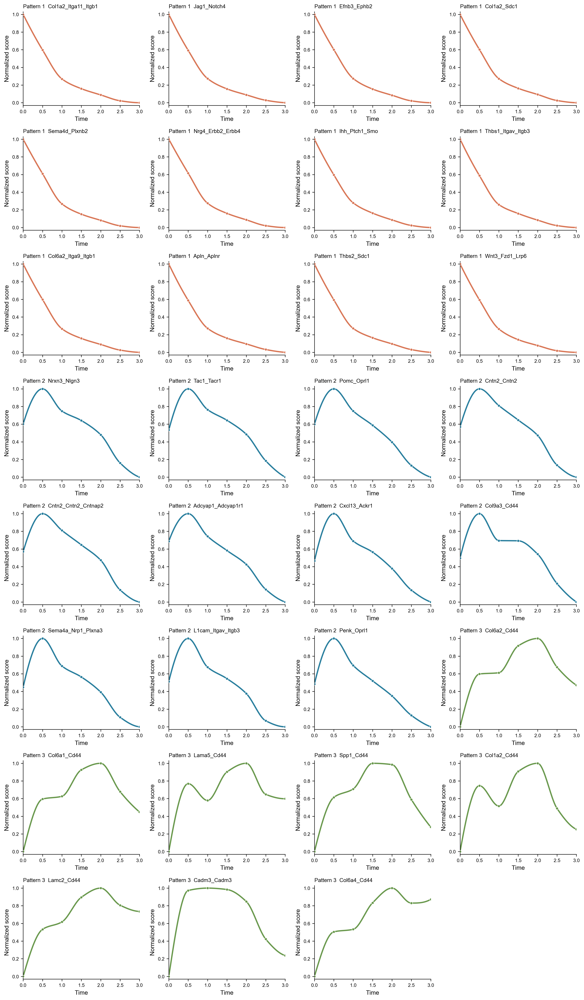

In [16]:
from reproduction.mosta.figures import plot_lr_profiles

selected_pairs = pd.read_csv(SOURCE / "si/S11/tables/s11_msum_stable_representative31.csv")
show(plot_lr_profiles(lr.pair_timecourse, selected_pairs, output))
reference.file.close()